In [57]:
# Importing pakages

import pandas as pd
import numpy as np
import io
import matplotlib.pyplot as plt
import seaborn as sns
import ydata_profiling as pp
import pickle

from sklearn.preprocessing import LabelEncoder

# import os
# import sys
# import warnings
# warnings.filterwarnings('ignore')

In [58]:
# Importing data
df = pd.read_csv("diabetic_data.csv")
df_dict = pd.read_csv("IDs_mapping.csv")

In [59]:
# Summary of data

print("diabetic_data")
display(df.head(), df.info(),df.describe())
print(len(df.columns), "\n", df.columns)

print("IDs_mapping")
display(df_dict.head(10), df_dict.info(),df_dict.describe())
print(len(df_dict.columns), "\n", df_dict.columns)

diabetic_data
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  in

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


None

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


50 
 Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')
IDs_mapping
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67

,admission_type_id,description
0,1,Emergency
1,2,Urgent
2,3,Elective
3,4,Newborn
4,5,Not Available
5,6,NaN
6,7,Trauma Center
7,8,Not Mapped
8,NaN,NaN
9,discharge_disposition_id,description


None

,admission_type_id,description
count,65,62
unique,32,58
top,1,Unknown/Invalid
freq,3,2


2 
 Index(['admission_type_id', 'description'], dtype='object')


- Nota que la estructura CSV esta rara en cuanto a las filas, mirar fila 9
- ¿Por qué hay datos con "?" en weigt? - Analicemos mas el df


### 1. Organizar data de df_dict para que sea mas facil de leer

In [60]:
def split_csv(input_filepath):
    """
    Splits a CSV file into multiple CSV files based on empty lines.
    
    Args:
    - input_filepath (str): Path to the CSV file to be split.
    
    Returns:
    - List[str]: List of paths to the generated CSV files.
    """
    # Read the CSV file line by line
    with open(input_filepath, 'r') as file:
        lines = file.readlines()

    # Detect empty lines to identify divisions between data sets
    empty_line_indices = [index for index, line in enumerate(lines) if line.strip() == ',']
    empty_line_indices.append(len(lines))

    # Split the file into data sets using empty lines as delimiters
    data_sets = []
    start_index = 0
    for end_index in empty_line_indices:
        data_set = lines[start_index:end_index]
        if data_set:
            data_sets.append(data_set)
        start_index = end_index + 1

    # Convert each data set to a pandas DataFrame using the io module
    dataframes = [pd.read_csv(io.StringIO(''.join(data_set))) for data_set in data_sets]

    # Save each DataFrame to an individual CSV file
    output_files = []
    for idx, df in enumerate(dataframes, start=1):
        output_file = f"dataset_{idx}.csv"
        df.to_csv(output_file, index=False)
        output_files.append(output_file)
    
    return output_files

In [61]:
# Re estructurando o dataset de IDS_mapping

output_files_function = split_csv("IDS_mapping.csv")
output_files_function

['dataset_1.csv', 'dataset_2.csv', 'dataset_3.csv']

In [62]:
# Remplazar variables de los diccionarios en el dataset principal
    # Vale la pena?

### 2. Calidad de datos para diabetic_data

In [63]:
# Revisamos si hay datos faltantes y los tipos de datos
missing_data = df.replace("?", pd.NA).isna().sum()
data_types = df.dtypes

# Calculamos el porcentaje de datos faltantes
missing_percentage = (missing_data / len(df)) * 100

# Combinamos los datos en un solo dataframe para una mejor visualización
data_quality_df = pd.DataFrame({
    'Missing Values': missing_data,
    'Missing %': missing_percentage,
    'Data Type': data_types
})

# Ordenamos por el porcentaje más alto de datos faltantes para una mejor visualización
data_quality_df.sort_values(by='Missing %', ascending=False).head(10)
# QUE VOLEO DE MISSING DATA


,Missing Values,Missing %,Data Type
weight,98569,96.858479,object
max_glu_serum,96420,94.746772,object
A1Cresult,84748,83.277322,object
medical_specialty,49949,49.082208,object
payer_code,40256,39.557416,object
race,2273,2.233555,object
diag_3,1423,1.398306,object
diag_2,358,0.351787,object
diag_1,21,0.020636,object
encounter_id,0,0.000000,int64


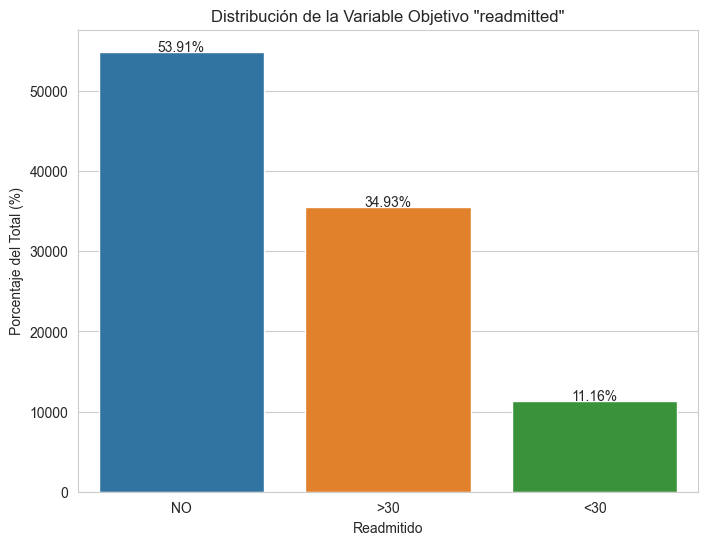

In [64]:
## Como se distribuye el target en porcentaje

unique_vals = set(df['readmitted'])

# Graficamos la distribución de la columna 'readmitted'
plt.figure(figsize=(8, 6))
sns.set_style("whitegrid")
ax = sns.countplot(data=df, x='readmitted')
plt.title('Distribución de la Variable Objetivo "readmitted"')
plt.xlabel('Readmitido')
plt.ylabel('Porcentaje del Total (%)')

# Modificar las etiquetas de y-tick para representar porcentajes
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + 3,
            '{:1.2f}%'.format(100 * height / len(df)),
            ha="center")

plt.show()

- Tenemos un problema de **clasificacion binaria** en donde solo el 11% de los usuarios son readmitidos y el 89% no

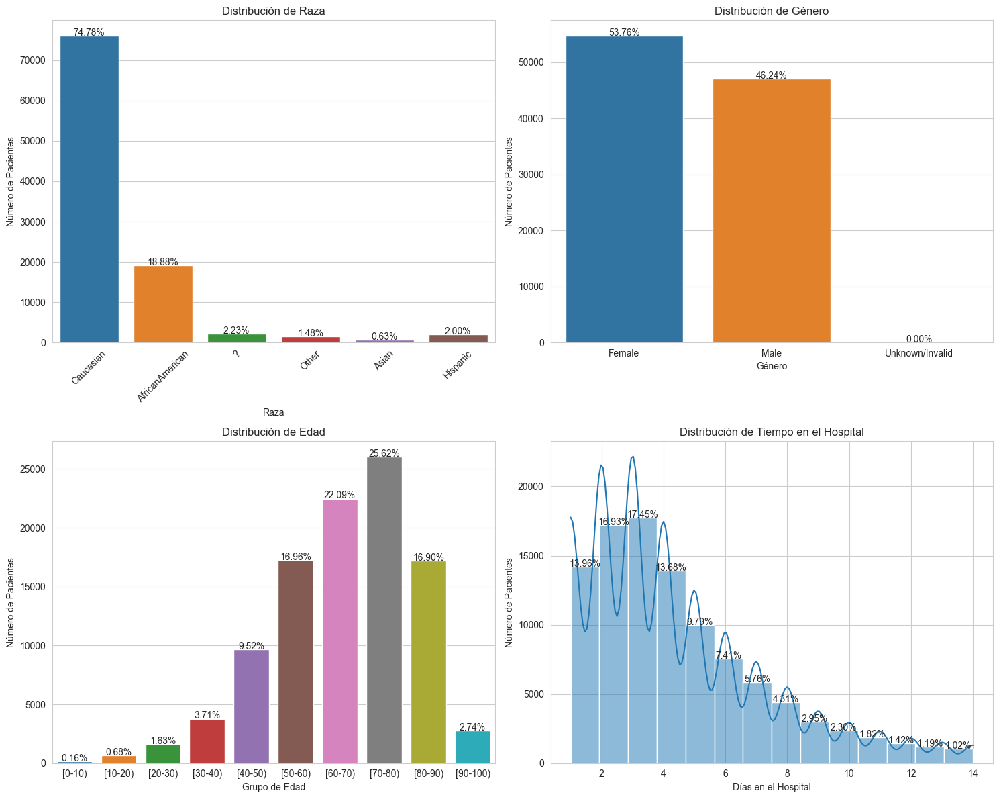

In [65]:
# Otras distribuciones de contexto del usuario

fig, axs = plt.subplots(2, 2, figsize=(15, 12))

# Distribucion de raza
sns.countplot(data=df, x='race', ax=axs[0, 0])
axs[0, 0].set_title('Distribución de Raza')
axs[0, 0].set_xlabel('Raza')
axs[0, 0].set_ylabel('Número de Pacientes')
axs[0, 0].tick_params(axis='x', rotation=45)
# Porcentajes de cada raza
total = float(len(df))
for p in axs[0, 0].patches:
    height = p.get_height()
    axs[0, 0].text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:.2f}%'.format(100*height/total),
            ha="center")

# Distribucion de genero
sns.countplot(data=df, x='gender', ax=axs[0, 1])
axs[0, 1].set_title('Distribución de Género')
axs[0, 1].set_xlabel('Género')
axs[0, 1].set_ylabel('Número de Pacientes')
# Porcentajes de cada género
total = float(len(df))
for p in axs[0,1].patches:
    height = p.get_height()
    axs[0, 1].text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:.2f}%'.format(100*height/total),
            ha="center")

# Distribucion de edad
sns.countplot(data=df, x='age', order=sorted(df['age'].unique()), ax=axs[1, 0])
axs[1, 0].set_title('Distribución de Edad')
axs[1, 0].set_xlabel('Grupo de Edad')
axs[1, 0].set_ylabel('Número de Pacientes')
# Porcentajes de cada grupo de edad
total = float(len(df))
for p in axs[1, 0].patches:
    height = p.get_height()
    axs[1, 0].text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:.2f}%'.format(100*height/total),
            ha="center")

# Distribucion de tiempo en el hospital
sns.histplot(data=df, x='time_in_hospital', bins=14, ax=axs[1, 1], kde=True)
axs[1, 1].set_title('Distribución de Tiempo en el Hospital')
axs[1, 1].set_xlabel('Días en el Hospital')
axs[1, 1].set_ylabel('Número de Pacientes')
# Porcentajes de cada grupo de edad
total = float(len(df))
for p in axs[1, 1].patches:
    height = p.get_height()
    axs[1, 1].text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:.2f}%'.format(100*height/total),
            ha="center")

plt.tight_layout()
plt.show()


- Raza, casi todos son blancos (**desbalanceada**)
- Sexo, uniforme
- Edad, priman los adultos mayores. Hay icos entre los 60 y los 80, casi el 50% de la poblacion
- La matoria estan internados de 1 a 4 dias 

In [66]:
# Pandas profiling

print(pp.__version__)

profile = pp.ProfileReport(df)
display(profile) 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

v4.5.1


Render HTML: 100%|██████████| 1/1 [00:07<00:00,  7.33s/it]


### Limpieza
    - Target binario
    - Borrar variables missing con mas del 39% (se ve en el profiling baja correlacion hasta ese umbral)
    - Borrar constantes
    - Transformar variables categoricas en algun codificado numerico

In [67]:
# Create a copy of the original dataset
df_featurated = df.copy()

# Convert the "readmitted" column to a binary target column and then to a numeric column
df_featurated['readmitted'] = pd.to_numeric(df_featurated['readmitted'].replace({'>30': 0, 'NO': 0, '<30': 1})) #TODO: PAL FE

In [68]:
# Drop variables that are not useful for the model becous has an unique value or has a lot of missing data (>39%) or constants
df_featurated.drop(['weight', 'payer_code', 'medical_specialty', 'examide', 'citoglipton'], axis=1, inplace=True) #TODO: PAL FE


In [69]:
def label_encoding(df):
    encoders = {}  # Diccionario para almacenar cada LabelEncoder
    le = LabelEncoder()
    
    for column in df.columns:
        if df[column].dtype == 'object':
            df[column] = le.fit_transform(df[column])
            encoders[column] = le  # Guarda el encoder entrenado en el diccionario
            le = LabelEncoder()  # Reinicia el encoder para la siguiente columna
    
    # Guarda el diccionario completo de encoders
    with open('encoders.pkl', 'wb') as file:
        pickle.dump(encoders, file)
    
    return df


In [70]:
# Calculates inbalanced data porcentage for each variable in df_featurated without readmitted
def inbalanced_data_percentage(df):
    inbalanced_data = []
    for column in df.columns:
        if column != 'readmitted':
            if df[column].value_counts(normalize=True).values[0] > 0.9:
                inbalanced_data.append(column)
    return inbalanced_data

inbalanced_data_columns = inbalanced_data_percentage(df_featurated) #TODO: Ver que hago con esto despues de la correlacion




In [71]:
# Encode the categorical features
df_encoded = label_encoding(df_featurated)


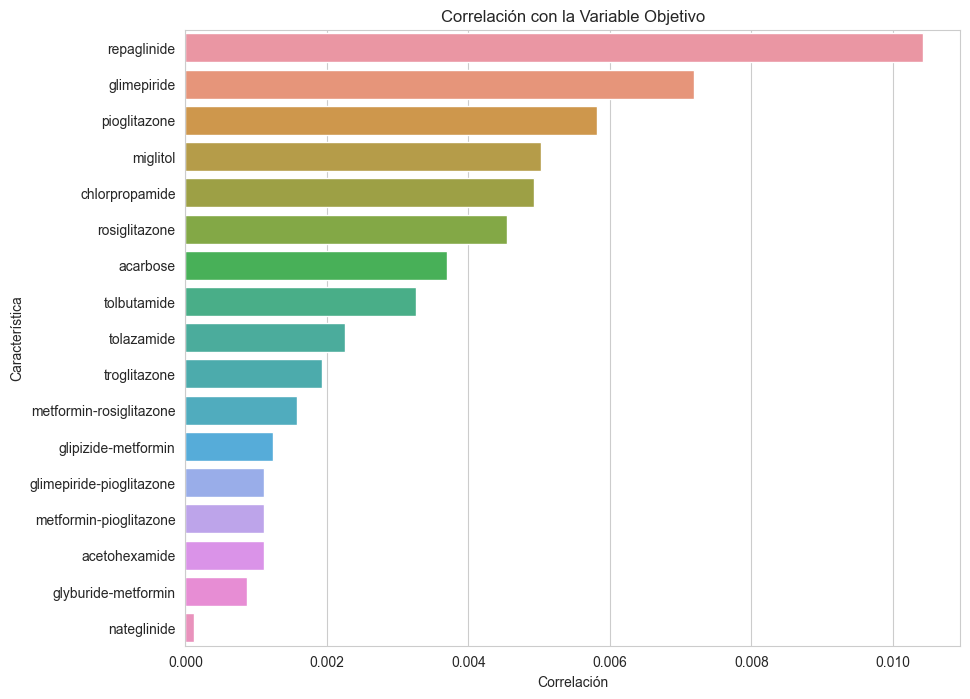

In [72]:

# Calculate correlation just between numeric features and readmitted from df_featurated
numeric_features = df_encoded[inbalanced_data_columns].columns
# numeric_features = numeric_features.drop('readmitted')
correlations = df_encoded[numeric_features].corrwith(df_encoded['readmitted']).abs().sort_values(ascending=False)

# Plot the correlations
plt.figure(figsize=(10, 8))
sns.barplot(x=correlations.values, y=correlations.index)
plt.title('Correlación con la Variable Objetivo')
plt.xlabel('Correlación')
plt.ylabel('Característica')
plt.show()

In [73]:
# Drop the features with low correlation and high inbalanced data percentage
df_encoded.drop(inbalanced_data_columns, axis=1, inplace=True)
df_encoded = df_encoded[df_encoded['gender'] != 2]


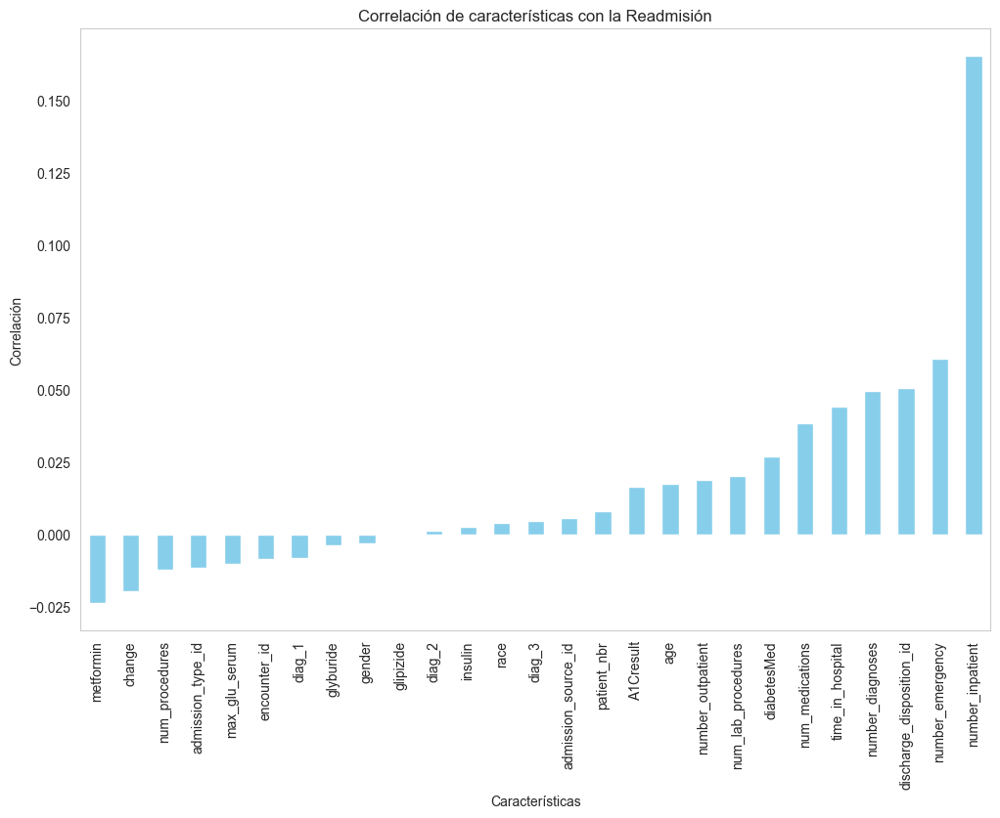

In [74]:
# Calcular la correlación de las características con 'readmitted'
correlations = df_encoded.corr()['readmitted'].sort_values()

# Visualizar las correlaciones
plt.figure(figsize=(12, 8))
correlations.drop('readmitted').plot(kind='bar', color='skyblue')
plt.title('Correlación de características con la Readmisión')
plt.ylabel('Correlación')
plt.xlabel('Características')
plt.grid()
plt.show()


In [75]:
model_columns = df_featurated.columns #TODO: Tener en cuenta pal predictivo

In [76]:
# Replace the encoded variables in the df_featurated dataset
df_featurated = pd.concat([df_encoded, df_featurated.select_dtypes(include=['int64', 'float64']).drop(['readmitted'], axis=1)], axis=1)

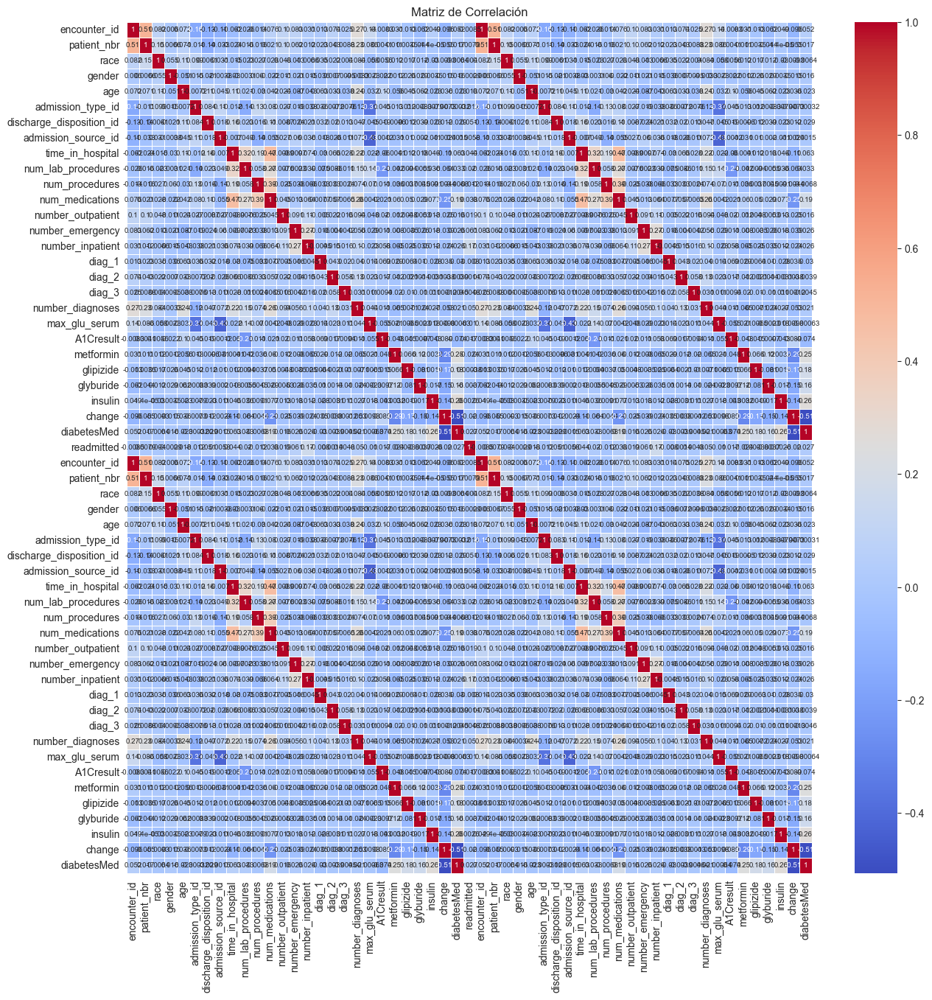

readmitted                  1.000000
number_inpatient            0.165143
number_inpatient            0.165143
number_emergency            0.060744
number_emergency            0.060744
discharge_disposition_id    0.050572
discharge_disposition_id    0.050572
number_diagnoses            0.049518
number_diagnoses            0.049518
time_in_hospital            0.044197
time_in_hospital            0.044197
num_medications             0.038433
num_medications             0.038433
diabetesMed                 0.027123
diabetesMed                 0.027123
num_lab_procedures          0.020359
num_lab_procedures          0.020359
number_outpatient           0.018890
number_outpatient           0.018890
age                         0.017638
age                         0.017638
A1Cresult                   0.016614
A1Cresult                   0.016614
patient_nbr                 0.007900
patient_nbr                 0.007900
admission_source_id         0.005818
admission_source_id         0.005818
d

In [77]:
# Correlación con la variable objetivo
correlation_with_target = df_featurated.corr()['readmitted'].sort_values(ascending=False)

# Matriz de correlación para identificar multicolinealidad entre características
correlation_matrix = df_featurated.corr()

plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={'size': 7})
plt.title("Matriz de Correlación")
plt.show()

correlation_with_target


Las características number_inpatient, number_emergency, discharge_disposition_id, number_diagnoses, entre otras, tienen una correlación positiva con la variable objetivo, aunque no son extremadamente altas. Estas características podrían ser relevantes para el modelo.

- no considero que hayan variables conceptualmente redundantes apesar de las correlaciones altas 

In [78]:
# Save the preprocessed dataset
df_featurated.to_csv('diabetes_preprocessed.csv', index=False)